## Data Import and Exploration

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import IsolationForest

In [2]:
import mlflow

mlflow.set_tracking_uri("http://127.0.0.1:5000")

In [3]:
import pandas as pd

# Load the dataset
file_path = 'Datasets/03_transaction_records.csv'
data = pd.read_csv(file_path)

# Display the first few rows of the dataset to understand its structure
data

,FISCAL_YR,FISCAL_MTH,DEPT_NAME,DIV_NAME,MERCHANT,CAT_DESC,TRANS_DT,AMT
0,2017,1,DEPT OF EDUCATION,DEPARTMENT OF EDUCATION,DOUBLETREE HOTELS WASHING,LODGING,6/3/2016,-5.50
1,2017,1,DEPT OF EDUCATION,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,6/26/2016,18.31
2,2017,1,DEPT OF EDUCATION,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,6/26/2016,21.61
3,2017,1,DEPT OF EDUCATION,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,6/26/2016,22.39
4,2017,1,DEPT OF EDUCATION,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,6/26/2016,5.44
...,...,...,...,...,...,...,...,...
15151,2022,6,DEPT OF EDUCATION,Academic Support,ENTERPRISE RENT-A-CAR,Car Rental,12/12/2021,52.58
15152,2022,6,DEPT OF EDUCATION,Academic Support,COURTYARD BY MARRIOTT-,Lodging,12/13/2021,14.91
15153,2022,6,DEPT OF EDUCATION,Academic Support,COURTYARD BY MARRIOTT-,Lodging,12/13/2021,111.00
15154,2022,6,DEPT OF EDUCATION,Student Support,PESI,Schools Educational Svc-Not Elsewhere Classified,12/5/2021,99.99


In [4]:
# Checking for missing values and basic information about the dataset
missing_values = data.isnull().sum()
data_info = data.info()

# Summary statistics for numerical columns
summary_statistics = data.describe()

missing_values, data_info, summary_statistics


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15156 entries, 0 to 15155
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   FISCAL_YR   15156 non-null  int64  
 1   FISCAL_MTH  15156 non-null  int64  
 2   DEPT_NAME   15156 non-null  object 
 3   DIV_NAME    15156 non-null  object 
 4   MERCHANT    15156 non-null  object 
 5   CAT_DESC    15156 non-null  object 
 6   TRANS_DT    15156 non-null  object 
 7   AMT         15156 non-null  float64
dtypes: float64(1), int64(2), object(5)
memory usage: 947.4+ KB


(FISCAL_YR     0
 FISCAL_MTH    0
 DEPT_NAME     0
 DIV_NAME      0
 MERCHANT      0
 CAT_DESC      0
 TRANS_DT      0
 AMT           0
 dtype: int64,
 None,
           FISCAL_YR    FISCAL_MTH           AMT
 count  15156.000000  15156.000000  15156.000000
 mean    2019.156374      6.293019    315.448271
 std        1.661039      3.542863   1530.714012
 min     2017.000000      1.000000 -12849.300000
 25%     2018.000000      3.000000     16.090000
 50%     2019.000000      6.000000     48.990000
 75%     2021.000000     10.000000    264.162500
 max     2022.000000     12.000000  88501.320000)

### Initial Observations:
Data Structure:

- The dataset contains 15,156 entries and 8 columns.
- Columns include a mix of numerical (int64, float64) and categorical (object) data types.

Missing Values:

- There are no missing values in the dataset, which simplifies the analysis.
  
Summary Statistics:

- The FISCAL_YR ranges from 2017 to 2022.
- The FISCAL_MTH column ranges from 1 to 12, which aligns with the 12 months in a year.
- The AMT column, which represents transaction amounts, has a wide range, from -12,849.30 to 88,501.32, suggesting the presence of both credits (negative values) and debits (positive values).

In [5]:
# Identify rows with problematic dates
def find_invalid_dates(date_series):
    invalid_rows = []
    for idx, date_str in enumerate(date_series):
        try:
            pd.to_datetime(date_str)
        except:
            invalid_rows.append((idx, date_str))
    return invalid_rows

invalid_dates = find_invalid_dates(data['TRANS_DT'])
invalid_dates[:10]  # Show first 10 invalid dates if there are any


[(5154, '2/29/2018'),
 (5155, '2/29/2018'),
 (5156, '2/29/2018'),
 (5157, '2/29/2018')]

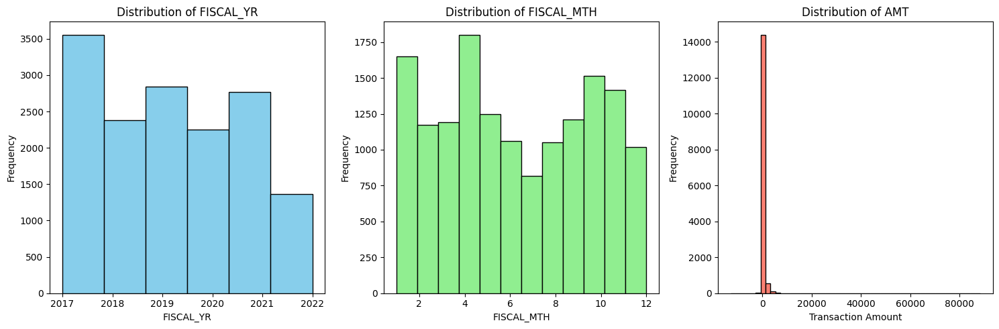

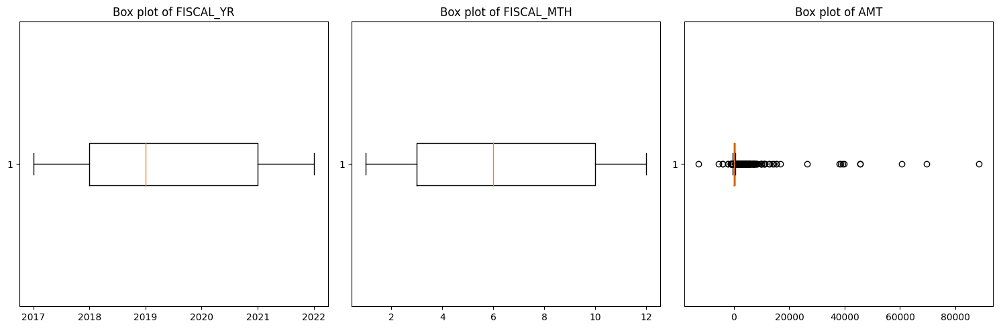

In [6]:
import matplotlib.pyplot as plt

# Histograms for numerical columns
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.hist(data['FISCAL_YR'], bins=6, color='skyblue', edgecolor='black')
plt.title('Distribution of FISCAL_YR')
plt.xlabel('FISCAL_YR')
plt.ylabel('Frequency')

plt.subplot(1, 3, 2)
plt.hist(data['FISCAL_MTH'], bins=12, color='lightgreen', edgecolor='black')
plt.title('Distribution of FISCAL_MTH')
plt.xlabel('FISCAL_MTH')
plt.ylabel('Frequency')

plt.subplot(1, 3, 3)
plt.hist(data['AMT'], bins=50, color='salmon', edgecolor='black')
plt.title('Distribution of AMT')
plt.xlabel('Transaction Amount')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Box plots for numerical columns to check for outliers
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.boxplot(data['FISCAL_YR'], vert=False)
plt.title('Box plot of FISCAL_YR')

plt.subplot(1, 3, 2)
plt.boxplot(data['FISCAL_MTH'], vert=False)
plt.title('Box plot of FISCAL_MTH')

plt.subplot(1, 3, 3)
plt.boxplot(data['AMT'], vert=False)
plt.title('Box plot of AMT')

plt.tight_layout()
plt.show()


### Univariate Analysis Observations:

Histograms:

- FISCAL_YR: The distribution is fairly even, with a noticeable number of transactions occurring each year from 2017 to 2022.

- FISCAL_MTH: The distribution across months is relatively uniform, indicating consistent transaction activity throughout the year.

- AMT: The transaction amounts have a right-skewed distribution, with most transactions clustered around lower amounts, but with some very high transactions indicating potential outliers.

Box Plots:

- FISCAL_YR and FISCAL_MTH: Both show no significant outliers, which is expected given these are categorical-like features representing time.

- AMT: There are significant outliers on both the lower and higher ends, which correspond to the negative values (likely refunds or credits) and extremely high values.


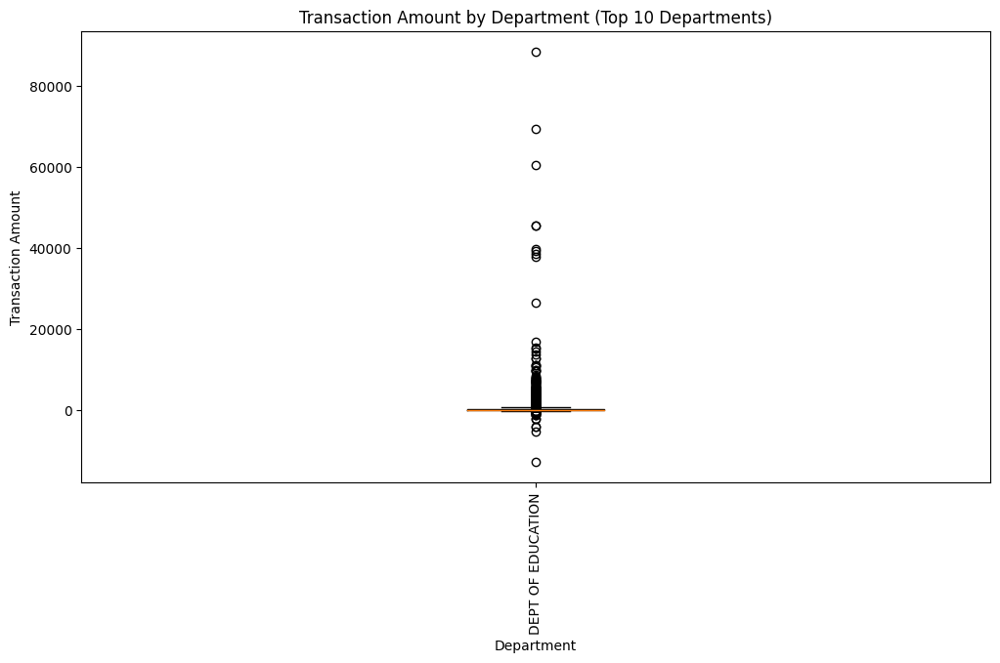

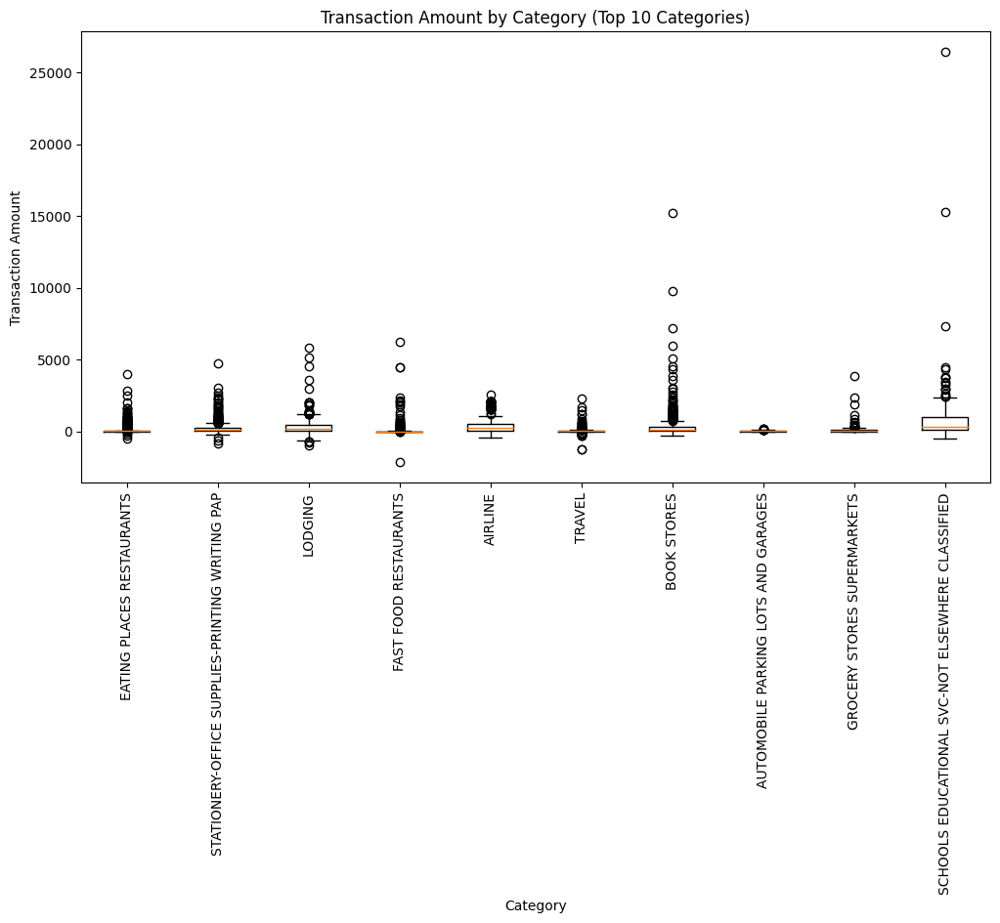

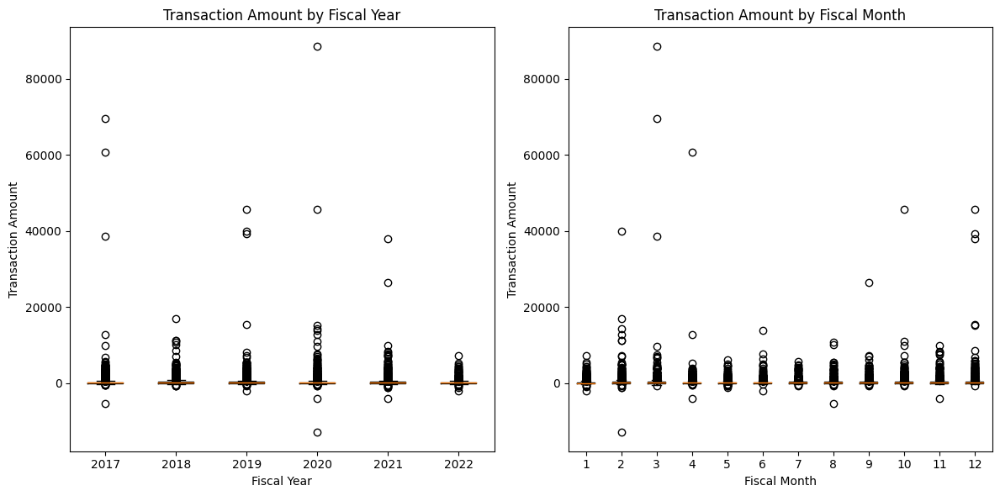

In [7]:
# Due to the large number of unique values in some categorical variables, we will select a subset for visualization

# Selecting the top 10 departments with the highest number of transactions
top_depts = data['DEPT_NAME'].value_counts().index[:10]

# Box plot of AMT by top 10 DEPT_NAMEs
plt.figure(figsize=(12, 6))
data_top_depts = data[data['DEPT_NAME'].isin(top_depts)]
plt.xticks(rotation=90)
plt.title('Transaction Amount by Department (Top 10 Departments)')
plt.xlabel('Department')
plt.ylabel('Transaction Amount')
plt.boxplot([data_top_depts[data_top_depts['DEPT_NAME'] == dept]['AMT'] for dept in top_depts], labels=top_depts)
plt.show()


data['CAT_DESC'] = data['CAT_DESC'].str.upper().str.strip()
# Selecting the top 10 categories with the highest number of transactions
top_cats = data['CAT_DESC'].value_counts().index[:10]

# Box plot of AMT by top 10 CAT_DESCs
plt.figure(figsize=(12, 6))
data_top_cats = data[data['CAT_DESC'].isin(top_cats)]
plt.xticks(rotation=90)
plt.title('Transaction Amount by Category (Top 10 Categories)')
plt.xlabel('Category')
plt.ylabel('Transaction Amount')
plt.boxplot([data_top_cats[data_top_cats['CAT_DESC'] == cat]['AMT'] for cat in top_cats], labels=top_cats)
plt.show()

# Relationship between AMT and FISCAL_YR, FISCAL_MTH
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.boxplot([data[data['FISCAL_YR'] == year]['AMT'] for year in sorted(data['FISCAL_YR'].unique())], 
            labels=sorted(data['FISCAL_YR'].unique()))
plt.title('Transaction Amount by Fiscal Year')
plt.xlabel('Fiscal Year')
plt.ylabel('Transaction Amount')

plt.subplot(1, 2, 2)
plt.boxplot([data[data['FISCAL_MTH'] == month]['AMT'] for month in sorted(data['FISCAL_MTH'].unique())], 
            labels=sorted(data['FISCAL_MTH'].unique()))
plt.title('Transaction Amount by Fiscal Month')
plt.xlabel('Fiscal Month')
plt.ylabel('Transaction Amount')

plt.tight_layout()
plt.show()


### Bivariate Analysis Observations:

Transaction Amount by Department (DEPT_NAME):

- There is significant variability in transaction amounts across the department of education.
- The department show a wide range of transaction amounts with notable outliers, indicating potentially larger expenditures or refunds in those departments.

Transaction Amount by Category (CAT_DESC):

- Similar to the department analysis, transaction amounts vary widely across different categories.
- Certain categories have consistently higher transaction amounts, while others have more variability and outliers.

Transaction Amount by Fiscal Year (FISCAL_YR):

- Transaction amounts appear relatively consistent across the years, but certain years might show a higher spread of amounts, possibly due to larger or more frequent transactions in those periods.

Transaction Amount by Fiscal Month (FISCAL_MTH):

- Transaction amounts are distributed fairly evenly across months, although some months show slightly higher or lower median transaction amounts.

## Data Cleaning and Feature Engineering

In [8]:
# Remove the rows with invalid dates
rows_to_remove = [idx for idx, date_str in invalid_dates]
data_cleaned = data.drop(index=rows_to_remove)

# Confirm removal by trying to convert dates again
data_cleaned['TRANS_DT'] = pd.to_datetime(data_cleaned['TRANS_DT'])

# Recheck for missing values
missing_values_after_removal = data_cleaned.isnull().sum()

# Generate descriptive statistics again after cleaning
descriptive_stats_after_removal = data_cleaned.describe()

missing_values_after_removal, descriptive_stats_after_removal


(FISCAL_YR     0
 FISCAL_MTH    0
 DEPT_NAME     0
 DIV_NAME      0
 MERCHANT      0
 CAT_DESC      0
 TRANS_DT      0
 AMT           0
 dtype: int64,
           FISCAL_YR    FISCAL_MTH                       TRANS_DT           AMT
 count  15152.000000  15152.000000                          15152  15152.000000
 mean    2019.156679      6.292569  2019-02-16 13:22:52.333684992    315.504861
 min     2017.000000      1.000000            2016-06-03 00:00:00 -12849.300000
 25%     2018.000000      3.000000            2017-07-17 00:00:00     16.087500
 50%     2019.000000      6.000000            2019-01-24 00:00:00     48.990000
 75%     2021.000000     10.000000            2020-08-14 00:00:00    264.375000
 max     2022.000000     12.000000            2021-12-20 00:00:00  88501.320000
 std        1.661152      3.543222                            NaN   1530.911560)

In [9]:
# Remove the DEPT_NAME column
data_prepared = data_cleaned.drop(columns=['DEPT_NAME'])

# Display the first few rows to confirm removal
data_prepared.head()


,FISCAL_YR,FISCAL_MTH,DIV_NAME,MERCHANT,CAT_DESC,TRANS_DT,AMT
0,2017,1,DEPARTMENT OF EDUCATION,DOUBLETREE HOTELS WASHING,LODGING,2016-06-03,-5.50
1,2017,1,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,2016-06-26,18.31
2,2017,1,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,2016-06-26,21.61
3,2017,1,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,2016-06-26,22.39
4,2017,1,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,2016-06-26,5.44


In [10]:
# Extract features from TRANS_DT
data_prepared['Year'] = data_prepared['TRANS_DT'].dt.year
data_prepared['Month'] = data_prepared['TRANS_DT'].dt.month
data_prepared['DayOfWeek'] = data_prepared['TRANS_DT'].dt.dayofweek
data_prepared['FiscalQuarter'] = data_prepared['FISCAL_MTH'].apply(lambda x: (x-1)//3 + 1)

# Drop the original TRANS_DT column as we've extracted necessary features
data_prepared = data_prepared.drop(columns=['TRANS_DT'])

# Display the first few rows to confirm feature extraction
data_prepared.head()


,FISCAL_YR,FISCAL_MTH,DIV_NAME,MERCHANT,CAT_DESC,AMT,Year,Month,DayOfWeek,FiscalQuarter
0,2017,1,DEPARTMENT OF EDUCATION,DOUBLETREE HOTELS WASHING,LODGING,-5.50,2016,6,4,1
1,2017,1,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,18.31,2016,6,6,1
2,2017,1,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,21.61,2016,6,6,1
3,2017,1,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,22.39,2016,6,6,1
4,2017,1,DEPARTMENT OF EDUCATION,HYATT REGENCY NW ORLE F/B,EATING PLACES RESTAURANTS,5.44,2016,6,6,1


In [11]:
# Fill missing values in categorical columns before encoding (This is the added step)
categorical_columns = ['DIV_NAME', 'MERCHANT', 'CAT_DESC']
data_prepared[categorical_columns] = data_prepared[categorical_columns].fillna('Unknown')

In [12]:
import joblib
from sklearn.preprocessing import LabelEncoder

# Initialize the LabelEncoder
label_encoder_div_name = LabelEncoder()
label_encoder_merchant = LabelEncoder()
label_encoder_cat_desc = LabelEncoder()

# Fit and transform the categorical columns
data_prepared['DIV_NAME'] = label_encoder_div_name.fit_transform(data_prepared['DIV_NAME'])
data_prepared['MERCHANT'] = label_encoder_merchant.fit_transform(data_prepared['MERCHANT'])
data_prepared['CAT_DESC'] = label_encoder_cat_desc.fit_transform(data_prepared['CAT_DESC'])

# Save the encoders
joblib.dump(label_encoder_div_name, 'div_name_encoder.pkl')
joblib.dump(label_encoder_merchant, 'merchant_encoder.pkl')
joblib.dump(label_encoder_cat_desc, 'cat_desc_encoder.pkl')


print(data_prepared.dtypes)

# Display the first few rows to confirm label encoding
data_prepared.head()


FISCAL_YR          int64
FISCAL_MTH         int64
DIV_NAME           int32
MERCHANT           int32
CAT_DESC           int32
AMT              float64
Year               int32
Month              int32
DayOfWeek          int32
FiscalQuarter      int64
dtype: object


,FISCAL_YR,FISCAL_MTH,DIV_NAME,MERCHANT,CAT_DESC,AMT,Year,Month,DayOfWeek,FiscalQuarter
0,2017,1,3,1400,79,-5.50,2016,6,4,1
1,2017,1,3,2075,55,18.31,2016,6,6,1
2,2017,1,3,2075,55,21.61,2016,6,6,1
3,2017,1,3,2075,55,22.39,2016,6,6,1
4,2017,1,3,2075,55,5.44,2016,6,6,1


In [13]:
# Train-Test Split
train, test = train_test_split(data_prepared, test_size=0.2, random_state=42)

### Updated Code Structure:
1. Data Cleaning:

- Handling invalid dates.
- Removing unnecessary columns.

2. Feature Engineering:

- Extracting features from TRANS_DT.
- Filling missing values in categorical data.
- Encoding categorical data.

3. Final Verification:

- Checking data types.
  
4. Model Preparation:

- Train-test split.

## Train, Validate, and Develop a Machine Learning Pipeline using PyCaret

In [14]:
from pycaret.anomaly import *

In [15]:


# Initialize the PyCaret environment
# We assume the target variable is 'AMT', and we aim to predict whether the transaction amount is high or low based on other features
# For this example, we'll binarize the 'AMT' to create a classification problem

# Enable experiment logging with MLFlow
exp1 = setup(data=data_prepared, session_id=123, log_experiment=True, normalize=True, transformation=True, experiment_name='anomaly_detection_experiment')

exp1

,Description,Value
0,Session id,123
1,Original data shape,"(15152, 10)"
2,Transformed data shape,"(15152, 10)"
3,Numeric features,10
4,Preprocess,True
5,Imputation type,simple
6,Numeric imputation,mean
7,Categorical imputation,mode
8,Transformation,True
9,Transformation method,yeo-johnson


In [16]:
get_config()

{'USI',
 'X',
 'X_train',
 'X_train_transformed',
 'X_transformed',
 '_available_plots',
 '_ml_usecase',
 'data',
 'dataset',
 'dataset_transformed',
 'exp_id',
 'exp_name_log',
 'gpu_n_jobs_param',
 'gpu_param',
 'html_param',
 'idx',
 'is_multiclass',
 'log_plots_param',
 'logging_param',
 'memory',
 'n_jobs_param',
 'pipeline',
 'seed',
 'train',
 'train_transformed',
 'variable_and_property_keys',
 'variables'}

In [17]:
get_config('X_train_transformed')

,FISCAL_YR,FISCAL_MTH,DIV_NAME,MERCHANT,CAT_DESC,AMT,Year,Month,DayOfWeek,FiscalQuarter
0,-1.110223e-16,-1.652308,-0.889045,-0.752003,0.432701,-0.246588,-1.110223e-16,-0.157926,0.215905,-1.349772
1,-1.110223e-16,-1.652308,-0.889045,-0.303439,-0.239997,-0.213455,-1.110223e-16,-0.157926,1.307167,-1.349772
2,-1.110223e-16,-1.652308,-0.889045,-0.303439,-0.239997,-0.209740,-1.110223e-16,-0.157926,1.307167,-1.349772
3,-1.110223e-16,-1.652308,-0.889045,-0.303439,-0.239997,-0.208872,-1.110223e-16,-0.157926,1.307167,-1.349772
4,-1.110223e-16,-1.652308,-0.889045,-0.303439,-0.239997,-0.228871,-1.110223e-16,-0.157926,1.307167,-1.349772
...,...,...,...,...,...,...,...,...,...,...
15151,1.110223e-16,0.016100,-1.989615,-0.638838,-1.112369,-0.177081,1.110223e-16,1.566279,1.307167,-0.319277
15152,1.110223e-16,0.016100,-1.989615,-0.939337,0.432701,-0.217361,1.110223e-16,1.566279,-1.689048,-0.319277
15153,1.110223e-16,0.016100,-1.989615,-0.939337,0.432701,-0.120808,1.110223e-16,1.566279,-1.689048,-0.319277
15154,1.110223e-16,0.016100,1.641425,0.208053,1.183029,-0.131082,1.110223e-16,1.566279,1.307167,-0.319277


In [18]:
# check all the available models
models()

,Name,Reference
ID,,
abod,Angle-base Outlier Detection,pyod.models.abod.ABOD
cluster,Clustering-Based Local Outlier,pycaret.internal.patches.pyod.CBLOFForceToDouble
cof,Connectivity-Based Local Outlier,pyod.models.cof.COF
iforest,Isolation Forest,pyod.models.iforest.IForest
histogram,Histogram-based Outlier Detection,pyod.models.hbos.HBOS
knn,K-Nearest Neighbors Detector,pyod.models.knn.KNN
lof,Local Outlier Factor,pyod.models.lof.LOF
svm,One-class SVM detector,pyod.models.ocsvm.OCSVM
pca,Principal Component Analysis,pyod.models.pca.PCA


In [19]:
# train iforest model
iforest_model = create_model('iforest')

In [20]:
iforest_results = assign_model(iforest_model)
iforest_results

,FISCAL_YR,FISCAL_MTH,DIV_NAME,MERCHANT,CAT_DESC,AMT,Year,Month,DayOfWeek,FiscalQuarter,Anomaly,Anomaly_Score
0,2017,1,3,1400,79,-5.500000,2016,6,4,1,0,-0.059165
1,2017,1,3,2075,55,18.309999,2016,6,6,1,0,-0.061120
2,2017,1,3,2075,55,21.610001,2016,6,6,1,0,-0.061120
3,2017,1,3,2075,55,22.389999,2016,6,6,1,0,-0.061120
4,2017,1,3,2075,55,5.440000,2016,6,6,1,0,-0.059956
...,...,...,...,...,...,...,...,...,...,...,...,...
15151,2022,6,1,1561,26,52.580002,2021,12,6,2,0,-0.026900
15152,2022,6,1,1148,79,14.910000,2021,12,0,2,0,-0.039057
15153,2022,6,1,1148,79,111.000000,2021,12,0,2,0,-0.036433
15154,2022,6,22,2958,107,99.989998,2021,12,6,2,0,-0.035211


In [21]:
evaluate_model(iforest_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

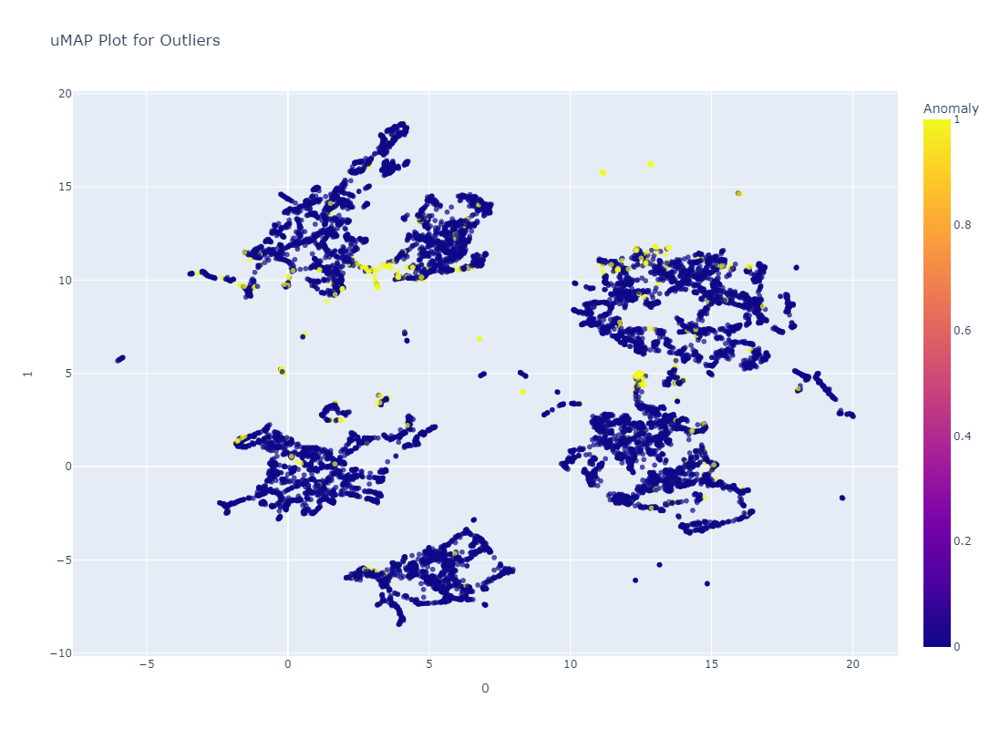

In [22]:
plot_model(iforest_model, plot='umap')

In [23]:
ocsvm_model = create_model('svm')

In [24]:
ocsvm_results = assign_model(ocsvm_model)
ocsvm_results

,FISCAL_YR,FISCAL_MTH,DIV_NAME,MERCHANT,CAT_DESC,AMT,Year,Month,DayOfWeek,FiscalQuarter,Anomaly,Anomaly_Score
0,2017,1,3,1400,79,-5.500000,2016,6,4,1,0,-93.351597
1,2017,1,3,2075,55,18.309999,2016,6,6,1,0,62.346632
2,2017,1,3,2075,55,21.610001,2016,6,6,1,0,62.053789
3,2017,1,3,2075,55,22.389999,2016,6,6,1,0,61.986021
4,2017,1,3,2075,55,5.440000,2016,6,6,1,0,63.613722
...,...,...,...,...,...,...,...,...,...,...,...,...
15151,2022,6,1,1561,26,52.580002,2021,12,6,2,0,526.049536
15152,2022,6,1,1148,79,14.910000,2021,12,0,2,1,588.108850
15153,2022,6,1,1148,79,111.000000,2021,12,0,2,1,583.696547
15154,2022,6,22,2958,107,99.989998,2021,12,6,2,0,304.886471


In [25]:
evaluate_model(ocsvm_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

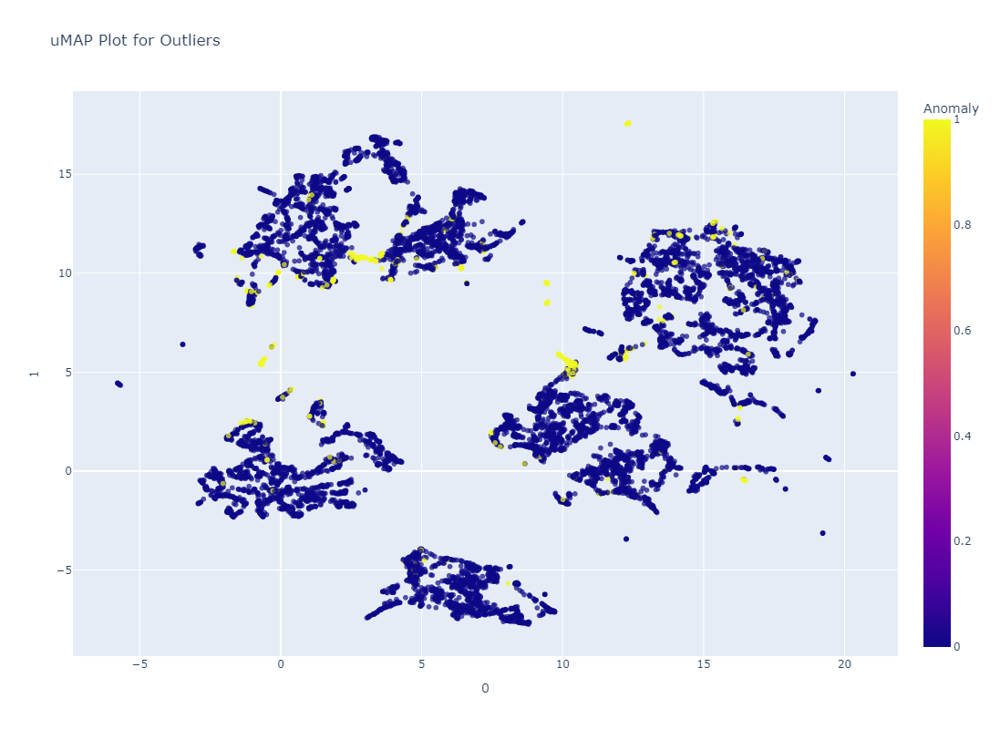

In [26]:
plot_model(ocsvm_model, plot='umap')

In [27]:
lof_model = create_model('lof')

In [28]:
lof_results = assign_model(lof_model)
lof_results

,FISCAL_YR,FISCAL_MTH,DIV_NAME,MERCHANT,CAT_DESC,AMT,Year,Month,DayOfWeek,FiscalQuarter,Anomaly,Anomaly_Score
0,2017,1,3,1400,79,-5.500000,2016,6,4,1,0,1.077669
1,2017,1,3,2075,55,18.309999,2016,6,6,1,0,1.009374
2,2017,1,3,2075,55,21.610001,2016,6,6,1,0,1.009384
3,2017,1,3,2075,55,22.389999,2016,6,6,1,0,1.009389
4,2017,1,3,2075,55,5.440000,2016,6,6,1,0,1.009469
...,...,...,...,...,...,...,...,...,...,...,...,...
15151,2022,6,1,1561,26,52.580002,2021,12,6,2,0,1.313448
15152,2022,6,1,1148,79,14.910000,2021,12,0,2,1,1.368141
15153,2022,6,1,1148,79,111.000000,2021,12,0,2,1,1.381839
15154,2022,6,22,2958,107,99.989998,2021,12,6,2,0,1.066872


In [29]:
evaluate_model(lof_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

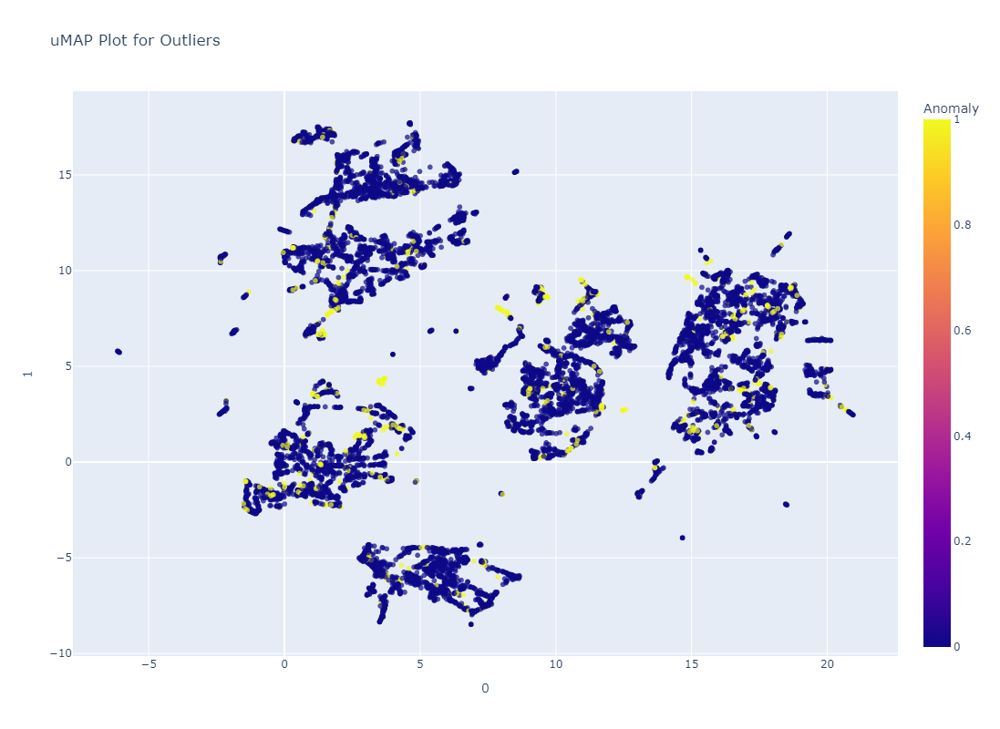

In [30]:
plot_model(lof_model, plot='umap')

In [31]:
mcd_model = create_model('mcd')

In [32]:
mcd_results = assign_model(mcd_model)
mcd_results

,FISCAL_YR,FISCAL_MTH,DIV_NAME,MERCHANT,CAT_DESC,AMT,Year,Month,DayOfWeek,FiscalQuarter,Anomaly,Anomaly_Score
0,2017,1,3,1400,79,-5.500000,2016,6,4,1,0,8.725729
1,2017,1,3,2075,55,18.309999,2016,6,6,1,0,7.093938
2,2017,1,3,2075,55,21.610001,2016,6,6,1,0,7.024408
3,2017,1,3,2075,55,22.389999,2016,6,6,1,0,7.014373
4,2017,1,3,2075,55,5.440000,2016,6,6,1,0,7.843260
...,...,...,...,...,...,...,...,...,...,...,...,...
15151,2022,6,1,1561,26,52.580002,2021,12,6,2,0,12.760711
15152,2022,6,1,1148,79,14.910000,2021,12,0,2,0,13.756832
15153,2022,6,1,1148,79,111.000000,2021,12,0,2,0,24.996237
15154,2022,6,22,2958,107,99.989998,2021,12,6,2,0,18.326175


In [33]:
evaluate_model(mcd_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

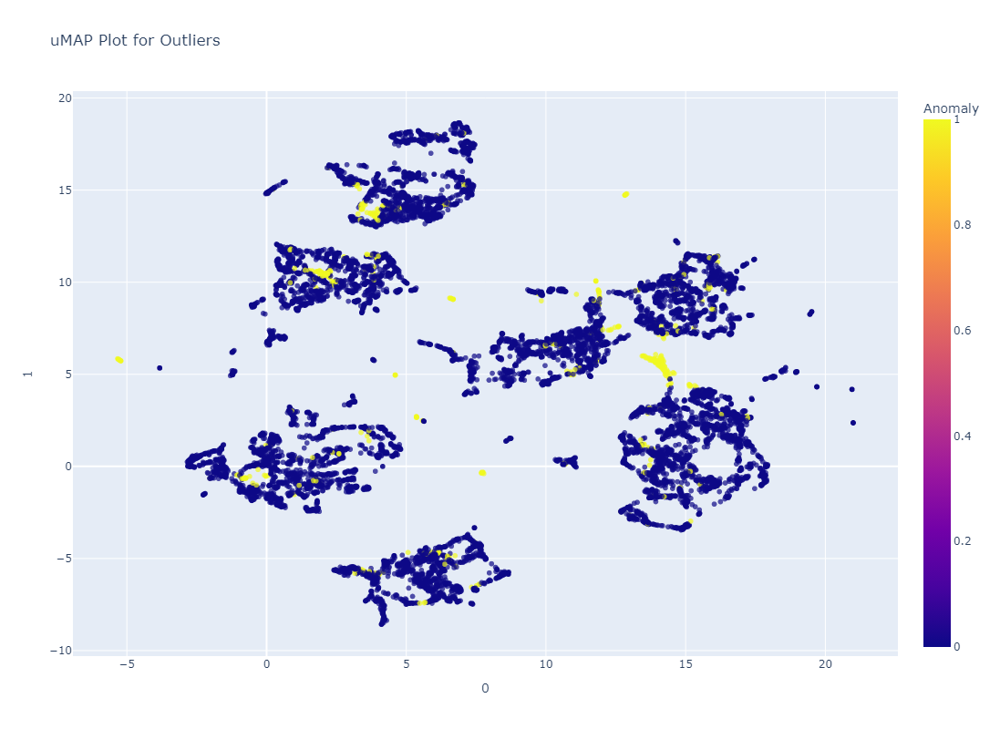

In [34]:
plot_model(mcd_model, plot = 'umap')

### Summary

1. Isolation Forest (iforest):
- Anomaly Scores: Relatively small and centered around zero.
- UMAP Plot: Shows a consistent distribution of anomalies, capturing both global and local outliers effectively.
- Pros: Well-suited for large datasets, robust, and typically performs well across a variety of anomaly detection tasks.
- Cons: Might not capture very subtle anomalies as effectively as more sensitive models.
2. One-Class SVM (ocsvm):
- Anomaly Scores: High variability in anomaly scores, indicating sensitivity to a range of anomalies.
- UMAP Plot: Captures a broad spread of anomalies, potentially identifying more outliers but possibly leading to more false positives.
- Pros: Sensitive to complex boundaries in high-dimensional data.
- Cons: Computationally expensive, prone to overfitting, and may require more careful tuning.
3. Local Outlier Factor (lof):
- Anomaly Scores: Typically above 1, consistent with LOF's design.
- UMAP Plot: Effective in identifying local anomalies, with anomalies detected in specific clusters.
- Pros: Great for detecting local outliers in datasets with varying densities.
- Cons: May struggle with identifying global anomalies or handling large-scale datasets.
4. Minimum Covariance Determinant (mcd):
- Anomaly Scores: Positive and concentrated, indicating a focus on anomalies that deviate from a Gaussian distribution.
- UMAP Plot: Captures global structure effectively, with anomalies identified across different clusters.
- Pros: Ideal for data that is approximately Gaussian.
- Cons: Less effective if the data does not follow a Gaussian distribution, sensitive to outliers in high-dimensional space.

### Recommendation:
Based on the analysis:

- Isolation Forest (iforest) is likely the best candidate for hyperparameter tuning. It has a good balance between sensitivity, robustness, and scalability. It performs well on various types of anomalies and doesn't require data to follow any specific distribution.
- Runner-up: Local Outlier Factor (lof) would be a good secondary option if you are particularly interested in detecting anomalies that deviate within local contexts.

## Hyperparameter Tuning

In [35]:
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import GridSearchCV

# Define the Isolation Forest model
iforest = IsolationForest()

# Define the hyperparameter grid
param_grid = {
    'n_estimators': [50, 100, 200],           # Number of trees in the forest
    'max_samples': ['auto', 0.7, 0.9],        # Number of samples to draw from the dataset
    'contamination': [0.01, 0.05, 0.1],       # The proportion of outliers
    'max_features': [1.0, 0.8, 0.5]           # Number of features to consider when looking for the best split
}

# Initialize GridSearchCV
grid_search = GridSearchCV(iforest, param_grid, scoring='accuracy', cv=5)

grid_search.fit(train)

# Get the best parameters
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

# Use the best model
best_iforest = grid_search.best_estimator_


Best Parameters: {'contamination': 0.01, 'max_features': 1.0, 'max_samples': 'auto', 'n_estimators': 50}


In [36]:
# Final model training with the best parameters
final_iforest = IsolationForest(
    contamination=0.01,
    max_features=1.0,
    max_samples='auto',
    n_estimators=50,
    random_state=42  # Ensure reproducibility
)

# Fit the final model on the entire training data
final_iforest.fit(train)

# Predict anomalies on the test set
y_pred = final_iforest.predict(test)

# Convert predictions (-1 for outliers, 1 for inliers) to a more intuitive format if needed
y_pred = [0 if x == -1 else 1 for x in y_pred]

# Evaluate the predictions (you can use accuracy, precision, recall, etc., depending on your need)
# Here, let's just print out the counts of anomalies detected in the test set:
print("Anomalies detected in test set:", sum([1 for x in y_pred if x == 0]))


Anomalies detected in test set: 30


In [37]:
iforest_model = create_model('iforest', 
                             n_estimators=50, 
                             max_samples='auto', 
                             contamination=0.01, 
                             max_features=1.0)

In [38]:
from pycaret.anomaly import save_model

# Assuming 'final_iforest' is your trained Isolation Forest model
save_model(iforest_model, model_name='final_iforest_model')


Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(include=['FISCAL_YR', 'FISCAL_MTH',
                                              'DIV_NAME', 'MERCHANT', 'CAT_DESC',
                                              'AMT', 'Year', 'Month',
                                              'DayOfWeek', 'FiscalQuarter'],
                                     transformer=SimpleImputer())),
                 ('categorical_imputer',
                  TransformerWrapper(include=[],
                                     transformer=SimpleImputer(strategy='most_frequent'))),
                 ('transformation',
                  TransformerWrapper(transformer=PowerTransformer(standardize=False))),
                 ('normalize', TransformerWrapper(transformer=StandardScaler())),
                 ('trained_model',
                  IForest(behaviour='new', bootstrap=False, contamination=0.05,
     max_features=1.0, max_samples='auto', n_est

In [39]:
from pycaret.anomaly import load_model

# Load the model
loaded_model = load_model('final_iforest_model')


Transformation Pipeline and Model Successfully Loaded


In [40]:
import mlflow

#Replace with your run id from mlflow localhost website
logged_model = 'runs:/71d120f8ce2d4de4bc3d9a648805f88a/model'

# Load model as a PyFuncModel.
loaded_model = mlflow.pyfunc.load_model(logged_model)



In [41]:
# print pipeline
print(loaded_model)
pipeline = loaded_model

mlflow.pyfunc.loaded_model:
  artifact_path: model
  flavor: mlflow.sklearn
  run_id: 71d120f8ce2d4de4bc3d9a648805f88a



In [42]:
registered_model = mlflow.register_model(
    "runs:/71d120f8ce2d4de4bc3d9a648805f88a/model", "iforest-registered"
)

Registered model 'iforest-registered' already exists. Creating a new version of this model...
2024/08/23 15:55:58 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: iforest-registered, version 4
Created version '4' of model 'iforest-registered'.
